In [1]:
import geopandas as gpd     # geojson 파일을 읽기 위함
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import folium # 라벨을 map에 시각화하기 위함
from shapely.geometry import Polygon     # 클래스(건물)의 면적을 구하기 위함
import re     # 문자열에서 숫자를 추출하기 위함
import json
import seaborn as sns
from rasterio.plot import show_hist     # tif 파일의 히스토그램을 그리기 위함
from rasterio.plot import show # tif 파일을 보기 위함
import rasterio # tif 파일을 읽기 위함
from pathlib import Path # 유효한 파일인지 확인하기 위함
from pymongo import MongoClient # MongoDB를 사용하기 위함

# 미션 1

In [2]:
# Polygon Data가 들어있지 않은 비어있는(NULL) geojson 파일을 삭제 해주는 과정
for num in range(3,1913):
    File = Path('geojson/buildings/buildings_AOI_3_Paris_img{0}.geojson'.format(num))
    if File.is_file(): # 유효한 파일 인지 검사..중간중간 번호가 비어있기 때문에 검증 필요
        print(num)
        df_train = gpd.read_file('geojson/buildings/buildings_AOI_3_Paris_img{0}.geojson'.format(num))
        if df_train.empty:     # 비어 있는 파일인지 검사하고 비어있다면 삭제
            df_train2 = 'geojson/buildings/buildings_AOI_3_Paris_img{0}.geojson'.format(num)
            os.remove(df_train2)
            

6
19
20
26
27
28
34
37
38
43
44
69
75
78
85
86
90
92
96
99
100
101
102
103
107
109
110
111
113
115
118
121
122
123
124
125
127
128
133
134
135
136
137
139
140
142
143
146
151
154
155
156
157
158
159
160
162
163
164
165
166
168
173
174
178
181
182
183
185
186
188
189
191
193
196
197
200
202
203
204
205
208
209
211
212
214
215
216
217
219
220
225
228
229
230
232
234
235
240
241
242
243
245
250
252
254
258
260
276
277
278
280
282
283
284
292
298
299
300
301
302
303
304
305
306
317
328
332
334
335
343
344
353
354
356
357
358
359
360
362
372
381
384
385
387
389
390
391
392
410
411
412
416
418
431
440
443
444
445
449
451
452
463
464
471
472
473
474
476
478
480
481
482
484
485
486
506
507
509
510
511
512
515
516
517
518
519
520
545
546
551
552
554
555
560
561
563
564
589
594
595
597
599
600
602
604
605
608
613
614
629
631
634
636
637
638
641
642
643
648
649
650
651
652
653
654
656
657
659
674
676
678
679
680
681
685
687
689
690
691
692
693
694
696
697
699
701
703
720
721
722
723
724
725
727
7

# QGIS를 이용하여 유효한 geojson 파일을 병합

In [3]:
m1 = folium.Map(
    location=[49.010002,2.265515],
    zoom_start=11
)



with open('geojson/Paris_building.geojson',mode='rt',encoding='utf-8') as f:
    geo = json.loads(f.read())
    f.close()

folium.GeoJson(
    geo,
    name='Paris'
).add_to(m1)

m1.save('map.html')
m1

# 미션 2

In [4]:
df = pd.read_csv('summaryData/AOI_3_Paris_Train_Building_Solutions.csv')

In [5]:
df.BuildingId.unique()     # NULL 데이터를 나타내는 Building == -1 을 확인 

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, -1, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82],
      dtype=int64)

In [6]:
df.BuildingId.value_counts()     # NULL 데이터의 갯수 확인

 1     633
 2     593
 3     560
 4     533
 5     519
-1     515
 6     504
 7     493
 8     481
 9     471
 10    454
 11    441
 12    424
 13    419
 14    414
 15    401
 16    394
 17    379
 18    372
 19    363
 20    357
 21    346
 22    337
 23    324
 24    315
 25    304
 26    291
 27    279
 28    270
 29    260
      ... 
 53     84
 54     75
 55     67
 56     66
 57     60
 58     52
 59     44
 60     40
 61     33
 62     30
 63     26
 64     24
 65     20
 66     17
 67     14
 68     11
 69     10
 70      6
 71      4
 72      4
 73      4
 74      3
 75      2
 76      2
 77      2
 78      2
 79      2
 81      1
 82      1
 80      1
Name: BuildingId, Length: 83, dtype: int64

In [7]:
idx = df[df['BuildingId'] == -1 ].index
df = df.drop(idx)     # NULL 데이터 삭제

In [8]:
df.BuildingId.unique()     # 삭제 확인

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82],
      dtype=int64)

# 클래스(건물)의 면적을 구하고 데이터프레임 생성

In [9]:
# 클래스(건물)의 면적을 반환하는 함수
def GetArea(data):
    polygon = Polygon(data)
    result = polygon.area
    return result

In [16]:
# 최종 결과물
# df에서 PolygonWKT_Pix 값을 뽑아내고 이를 활용해 클래스의 면적을 구하고
# 클래스의 면적 값을 넣은 새로운 데이터프레임 생성
cols = ['PolygonArea']     # 새로운 데이터프레임의 컬럼
lst = []     # 새로운 데이터 프레임의 Value
for i in range(0, len(df)): # 전체 데이터프레임의 길이 만큼 반복
    df_test = df.iloc[i,2]  # PolygonWKT_Pix 값을 0번 인덱스부터 순차적으로 호출
    Data = re.findall(r"\b\d.+\b", df_test) # 문자열과 특수문자를 제외한 숫자만 추출
    Data2 = Data[0].split(',') # 하나의 문자열로 된 숫자를 , 를 기준으로 각각 분리
    for j in range(len(Data2)): # 분리되어진 문자열의 수 만큼 반복
        temp = Data2[j] # 문자열값 임시 저장
        idx = temp[:len(temp)-2] # 의미없는 문자열 및 공백 제거 (` 0`)
        Data2[j] = idx # 문자열 갱신
        Fin = re.findall("\d.+", Data2[j]) # 두 개의 Pix 값을 포함한 리스트로 하여 Data2[0],[1] 형태로 관리하기 위함
        Data2[j] = Fin[0].split(' ')  # 하나의 문자열에 포함된 두 개의 Pix 값을 분리 시키기 위함
        if Data2[j][0] == '0 0': # 분리되지 않는 0 0 과 같은 특수한 경우를 위한 예외 옵션
            Data2[j] = []
            Data2[j].append('0')
            Data2[j].append('0') # 0 0 값을 구분하기 위하여 각각 추가
        temp1 = Data2[j][0] # 이 작업을 위해 Fin을 활용
        temp2 = Data2[j][1] 
        idx1 = float(temp1) # 문자열을 실수형으로 변환
        idx2 = float(temp2)
        Data2[j] = [idx1, idx2] # 실수형 값을 넣어 Data2 갱신 
        
    GetArea(Data2) # 위 작업을 통해 얻은 Pix 데이터를 통해 클래스의 면적 계산  
    lst.append([GetArea(Data2)]) # 위에서 구한 면적 값을 삽입
df1 = pd.DataFrame(lst, columns=cols) # 새로운 데이터 프레임 생성
df1

,PolygonArea
0,327.56125
1,86.78400
2,759.60025
3,1678.13915
4,1849.04460
5,1155.01190
6,2874.77280
7,3743.45550
8,1333.96550
9,2811.93125


In [11]:
df1.describe() # df1의 표준편차가 큼 --> 왜도가 심할 것으로 예상

,PolygonArea
count,16633.000000
mean,2020.538187
std,4281.339382
min,0.000150
25%,609.588000
50%,1395.877800
75%,2089.802600
max,249184.612050


In [12]:
df1.loc[df1['PolygonArea'] < 2020, 'Area'] = 1 # PolygonArea가 평균보다 작은 경우
df1.loc[(2020 <= df1['PolygonArea']) & (df1['PolygonArea'] < 250000), 'Area'] = 2 # PolygonArea가 평균보다 큰 경우

In [13]:
df1.drop(['PolygonArea'], axis='columns',inplace=True) # 기존의 PolygonArea 컬럼 삭제
df1['Area'].value_counts() # Area 컬럼의 value_counts

1.0    12152
2.0     4481
Name: Area, dtype: int64

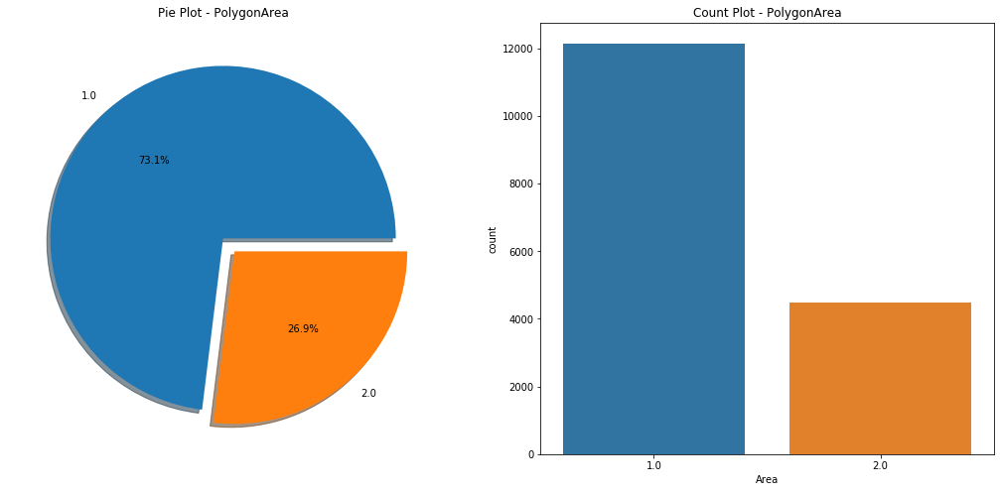

In [14]:
f, ax = plt.subplots(1, 2, figsize=(18,8))
df1['Area'].value_counts().plot.pie(explode=[0, 0.1], autopct= '%1.1f%%',
                                    ax=ax[0], shadow=True)
ax[0].set_title('Pie Plot - PolygonArea')
ax[0].set_ylabel('')
sns.countplot('Area', data=df1, ax=ax[1])
ax[1].set_title('Count Plot - PolygonArea')
plt.show()

# 면적 분포 그래프

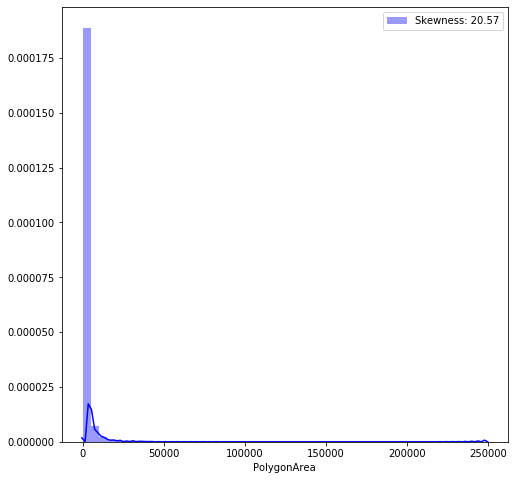

In [17]:
# 왜도가 심함 ( 20.57 )
f, ax = plt.subplots(1, 1, figsize=(8,8))
g = sns.distplot(df1['PolygonArea'], color='b', label='Skewness: {:.2f}'.format(df1['PolygonArea'].skew()), ax=ax) 
g = g.legend(loc='best')

In [19]:
# 왜도를 줄이기 위한 특성공학( 로그 취해주기 )
df1['PolygonArea'] = df1['PolygonArea'].map(lambda i : np.log(i) if i > 0 else 0)
df1['PolygonArea'] 

0        5.791675
1        4.463422
2        6.632792
3        7.425441
4        7.522424
5        7.051866
6        7.963729
7        8.227764
8        7.195911
9        7.941627
10       7.232346
11       7.661143
12       7.663265
13       6.992524
14       7.070019
15       8.256562
16       7.173248
17       6.767152
18       7.962050
19       4.059539
20       6.906997
21       7.774140
22       7.452541
23       7.570398
24       6.115711
25       7.147605
26       7.422128
27       7.158178
28       6.281930
29       5.722932
           ...   
16603    7.378510
16604    7.296758
16605    7.748512
16606    7.694271
16607    7.164017
16608    7.599008
16609    7.771881
16610    7.285930
16611    7.523440
16612    4.736932
16613    7.689663
16614    6.089541
16615    7.570360
16616    6.592605
16617    7.125926
16618    7.286487
16619    7.117035
16620    7.548105
16621    5.761669
16622    5.345553
16623    7.350455
16624    7.387181
16625    4.206590
16626    7.568609
16627    5

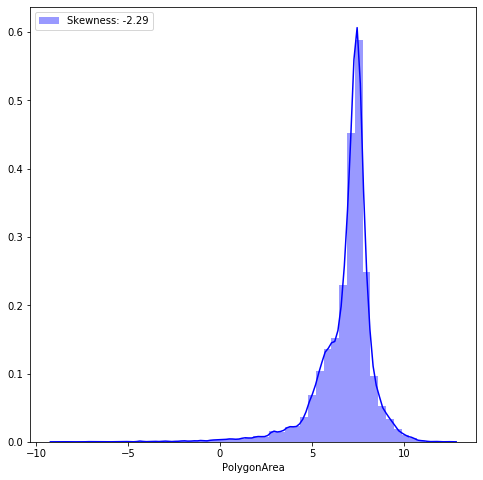

In [20]:
# 왜도가 많이 줄어듬 ( 안정 수치 -2 ~ 2 )
f, ax = plt.subplots(1, 1, figsize=(8,8))
g = sns.distplot(df1['PolygonArea'], color='b', label='Skewness: {:.2f}'.format(df1['PolygonArea'].skew()), ax=ax) 
g = g.legend(loc='best')

# 미션 3

In [21]:
N = input(int)
src_MUL = rasterio.open('MUL/MUL_AOI_3_Paris_img{0}.tif'.format(N))
src_MUL_PAN = rasterio.open('MUL-PanSharpen/MUL-PanSharpen_AOI_3_Paris_img{0}.tif'.format(N))
src_PAN = rasterio.open('PAN/PAN_AOI_3_Paris_img{0}.tif'.format(N))
src_RGB = rasterio.open('RGB-PanSharpen/RGB-PanSharpen_AOI_3_Paris_img{0}.tif'.format(N))

<class 'int'>1018


Text(0.5, 1.0, '3-band Image')

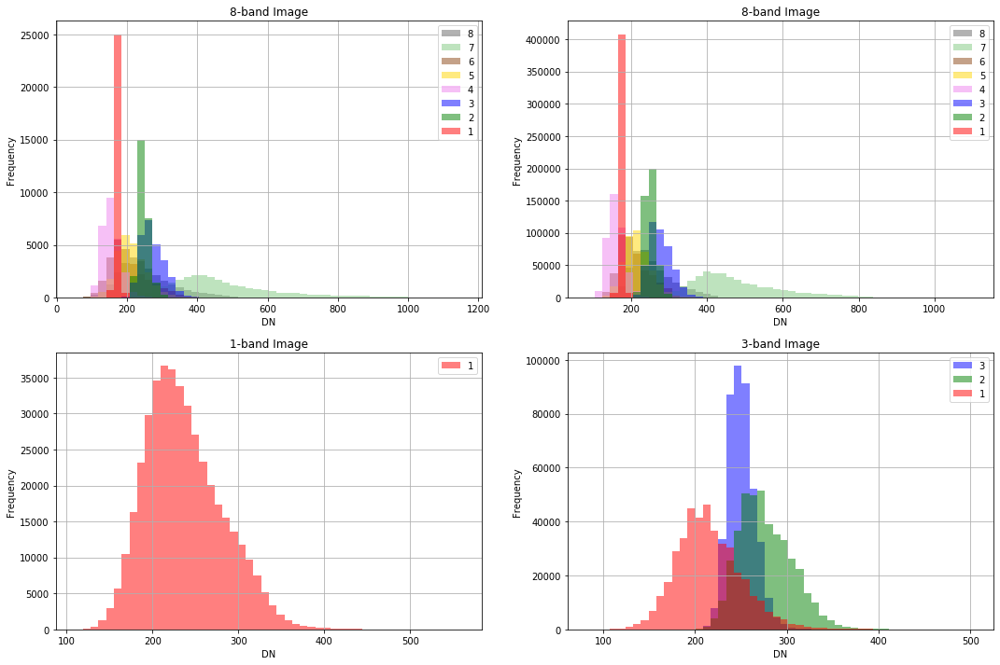

In [22]:
f , ax = plt.subplots(2, 2, figsize=(18,12))
data=show_hist(
    src_MUL, bins=50,  lw=0.0, stacked=False, alpha=0.5,
    histtype='stepfilled', title='histogram', ax= ax[0,0])
ax[0,0].set_title('8-band Image')

data=show_hist(
    src_MUL_PAN, bins=50,  lw=0.0, stacked=False, alpha=0.5,
    histtype='stepfilled', title='histogram', ax= ax[0,1])
ax[0,1].set_title('8-band Image')

data=show_hist(
    src_PAN, bins=50,  lw=0.0, stacked=False, alpha=0.5,
    histtype='stepfilled', title='histogram', ax= ax[1,0])
ax[1,0].set_title('1-band Image')

data=show_hist(
    src_RGB, bins=50,  lw=0.0, stacked=False, alpha=0.5,
    histtype='stepfilled', title='histogram', ax= ax[1,1])
ax[1,1].set_title('3-band Image')

# 미션 4

In [23]:
client = MongoClient('mongodb://localhost:27017/') # MongoDB와 연결
print(client.list_database_names()) # 연결 확인

['Project', 'SIA_Project', 'Sample', 'Testing', 'admin', 'config', 'local', 'test']


In [28]:
myDB = client['SIA_Project'] # 'Project' DB 생성

In [29]:
myData = myDB['SIA_Data'] # 'Data' 컬렉션 생성 

In [24]:
# 클래스의 면적과 이미지를 딕셔너리 형태로 저장하기 위해 데이터프레임 재구성
df1['ImageId'] = df['ImageId']
df1

,PolygonArea,ImageId
0,5.791675,AOI_3_Paris_img485
1,4.463422,AOI_3_Paris_img485
2,6.632792,AOI_3_Paris_img485
3,7.425441,AOI_3_Paris_img485
4,7.522424,AOI_3_Paris_img485
5,7.051866,AOI_3_Paris_img485
6,7.963729,AOI_3_Paris_img485
7,8.227764,AOI_3_Paris_img485
8,7.195911,AOI_3_Paris_img485
9,7.941627,AOI_3_Paris_img485


In [ ]:
df1_dict = df1.to_dict("records") # 딕셔너리 형태로 변환

In [ ]:
myData.insert_many(df1_dict)

In [25]:
def Search_DB(number):
    y = myData.find({"PolygonArea": {"$gt": number}}).sort("PolygonArea")
    temp = []
    for doc in y:
        a = doc['ImageId'] # ImageId Value(AOI_3_Paris_imgXXX)에서
        b = re.findall(r"\d+\b", a) # XXX(숫자)를 추출하기 위함
        temp.append(b) # 추출된 숫자를 리스트에 넣어준다.
    lst = []
    for i in temp:
        lst.append(int(i[0])) # 문자열(숫자)을 실수형으로 바꿔서 lst에 넣어준다.
    
    return lst

In [30]:
number = 11.7
Search_DB(number) # number 이상의 면적을 가진 img 파일 추출 확인

[921, 1142, 303]

In [33]:
Map = folium.Map(
        location=[49.008468726000046,2.26062150000007],
        zoom_start=13
    )

In [31]:
def DB(Map):
    # folium 으로 지도 불러오기
    lst = Search_DB(number)
    for i in lst: # lst = 1379, 921, 1142
        df_last = df[df['ImageId'] == 'AOI_3_Paris_img{0}'.format(i)].iloc[0,3]
        data = re.findall(r"\b\d.+\b", df_last) # 문자열과 특수문자를 제외한 숫자만 추출
        data2 = data[0].split(',') # 하나의 문자열로 된 숫자를 , 를 기준으로 각각 분리

        temp = data2[0] # 문자열값 임시 저장
        idx = temp[:len(temp)-2] # 의미없는 문자열 및 공백 제거 (` 0`)
        data2[0] = idx # 첫 번째 문자열(숫자) 추출
        data3 = data2[0].split(' ') # 공백을 기준으로 두 개의 문자열로 구분
        real_data = [] # 배열 생성
        for j in data3: # 문자열을 각각 실수형으로 변환 후 배열에 삽입 
            real_data.append(float(j))


        # lst 값에 해당하는 geojson을 각각 읽어 들이고 지도에 표시
        with open('geojson/buildings/buildings_AOI_3_Paris_img{0}.geojson'.format(i),mode='rt',encoding='utf-8') as f:
            geo = json.loads(f.read())
            f.close()


        folium.GeoJson(
            geo,
            name='Paris_Train'
        ).add_to(Map)

        # 각각의 geojson의 첫번째 Polygon 데이터에 마커를 찍어서 각각의 이미지를 구분
        folium.Marker(
            location=[real_data[1], real_data[0]],
            popup='img'+str(i),
            icon=folium.Icon(color='red',icon='star')
        ).add_to(Map)
        
        # 각각의 geojson과 짝이되는 tif파일의 이미지와 히스토그램을 그림.
        src = rasterio.open('RGB-PanSharpen/RGB-PanSharpen_AOI_3_Paris_img{0}.tif'.format(i))
        fig, (axrgb, axhist) = plt.subplots(1, 2, figsize=(14,7))
        show(src, ax=axrgb, title= 'Img{0}.tif'.format(i), cmap='gray')
        show_hist(src, bins=50, histtype='stepfilled',
                  lw=0.0, stacked=False, alpha=0.6, ax=axhist)
        
    Map.save('map.html')
    return Map


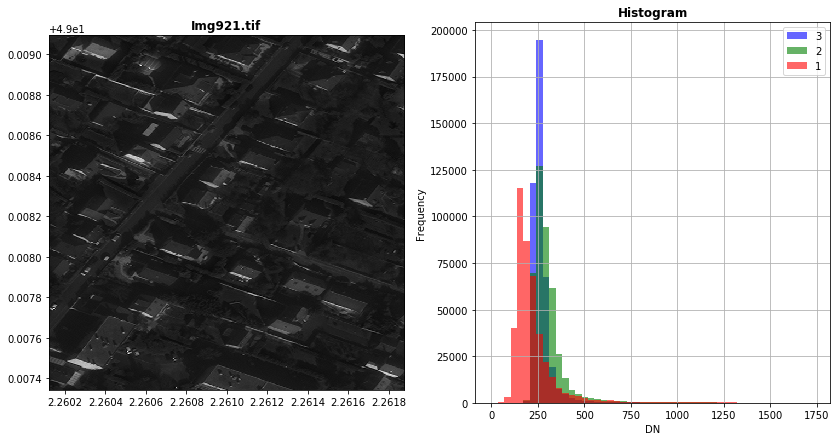

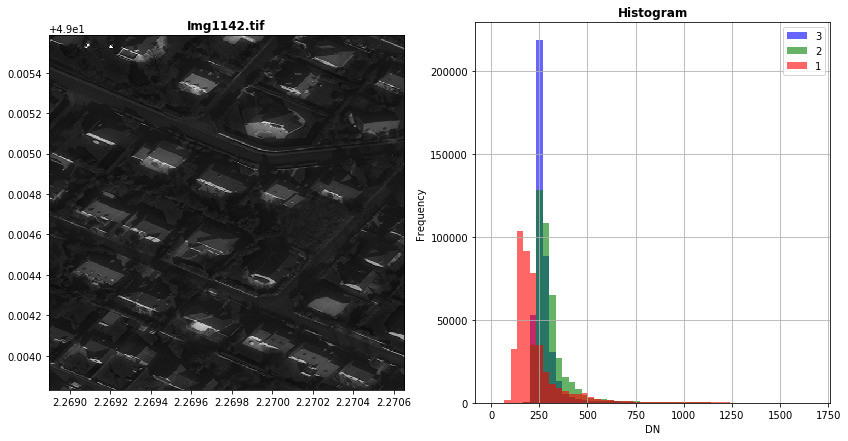

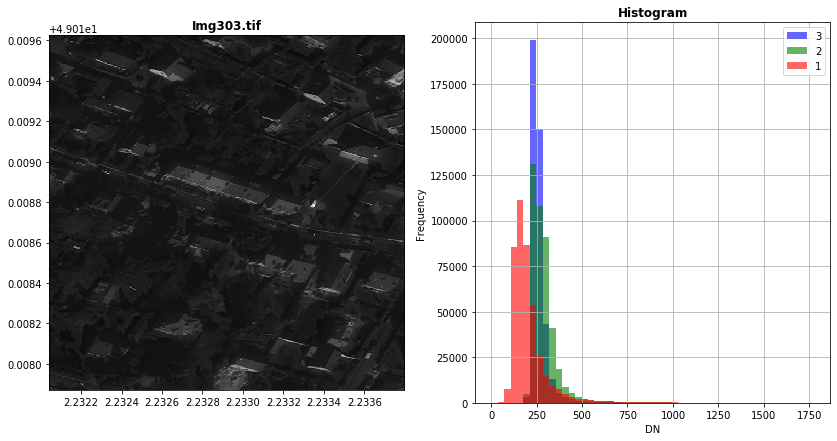

In [34]:
DB(Map)